<a href="https://colab.research.google.com/github/nicholaskuo/Feature_Pyramid_Network/blob/main/Feature_Pyramid_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class Bottleneck(nn.Module):
  expand_factor = 4

  def __init__(self, in_channels, out_channels, stride = 1):
    super(Bottleneck, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
    self.bn1 = nn.BatchNorm2d(out_channels)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(out_channels)
    self.conv3 = nn.Conv2d(out_channels, self.expand_factor*out_channels, kernel_size=1, bias=False)
    self.bn3 = nn.BatchNorm2d(self.expand_factor*out_channels)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_channels != self.expand_factor*out_channels:
      self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, self.expand_factor*out_channels, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(self.expand_factor*out_channels)
      )
  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = F.relu(self.bn2(self.conv2(out)))
    out = self.bn3(self.conv3(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

In [ ]:
class Feature_Pyramid_Network(nn.Module):
  '''
    num_blocks: list of 4 integers, indicating # of blocks for bottom-up layer
  '''
  def __init__(self, bottleneck_block, num_blocks):
    super(Feature_Pyramid_Network, self).__init__()

    # in_channels into the FPN
    self.in_channels = 64
    self.conv1 = nn.Conv2d(3, self.in_channels, kernel_size=7, stride =2, padding=3, bias=False)
    self.bn1 = nn.BatchNorm2d(self.in_channels)
    
    # Bottom-up layers
    self.layer1 = self.make_layer(bottleneck_block,  64, num_blocks[0], stride=1)
    self.layer2 = self.make_layer(bottleneck_block, 128, num_blocks[1], stride=2)
    self.layer3 = self.make_layer(bottleneck_block, 256, num_blocks[2], stride=2)
    self.layer4 = self.make_layer(bottleneck_block, 512, num_blocks[3], stride=2)

    # Top layer
    self.toplayer = nn.Conv2d(2048, 256, kernel_size=1, stride=1, padding=0)  # Reduce channels

    # Smooth layers
    self.smooth1 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
    self.smooth2 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)
    self.smooth3 = nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1)

    # Lateral layers
    self.latlayer1 = nn.Conv2d(1024, 256, kernel_size=1, stride=1, padding=0)
    self.latlayer2 = nn.Conv2d( 512, 256, kernel_size=1, stride=1, padding=0)
    self.latlayer3 = nn.Conv2d( 256, 256, kernel_size=1, stride=1, padding=0)

  # create bottom_up
  def make_layer(self, bottleneck_block, out_channels, num_blocks, stride):
    strides = [stride] + [1]*(num_blocks-1)
    layers = []
    for stride in strides:
      layers.append(bottleneck_block(self.in_channels, out_channels, stride))
      self.in_channels = out_channels * bottleneck_block.expand_factor
    return nn.Sequential(*layers)
  
  def upsample_and_add(self, top_feature_map, lateral_feature_map):
    '''
      Using bilinear upsample:
        top_feature_map: top-down layer which is being upsampled
        lateral_feature_map: lateral feature map after undergoing 1x1 conv
    '''
    _,_,H,W = lateral_feature_map.size()
    return F.interpolate(top_feature_map, size=(H,W), mode='bilinear', align_corners=False) + lateral_feature_map

  def forward(self, x):
    # Bottom-up
    c1 = F.relu(self.bn1(self.conv1(x)))
    c1 = F.max_pool2d(c1, kernel_size=3, stride=2, padding=1)
    c2 = self.layer1(c1)
    c3 = self.layer2(c2)
    c4 = self.layer3(c3)
    c5 = self.layer4(c4)
    
    # Top-down
    p5 = self.toplayer(c5)
    p4 = self.upsample_and_add(p5, self.latlayer1(c4))
    p3 = self.upsample_and_add(p4, self.latlayer2(c3))
    p2 = self.upsample_and_add(p3, self.latlayer3(c2))
    
    # Smooth
    p4 = self.smooth1(p4)
    p3 = self.smooth2(p3)
    p2 = self.smooth3(p2)
    return p2, p3, p4, p5

Image Visualization of FPN

In [ ]:
def test():
  # Note: [2,2,2,2] is the format of Resnet101's last 4 conv layers
  neck = Feature_Pyramid_Network(Bottleneck, [2,2,2,2])
  testTensor = torch.randn(1,3,800,800)
  outputs = neck(testTensor)
  for output in outputs:
    print(output.size())

test()

torch.Size([1, 256, 200, 200])
torch.Size([1, 256, 100, 100])
torch.Size([1, 256, 50, 50])
torch.Size([1, 256, 25, 25])


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


torch.Size([1, 3, 1237, 2200])
torch.Size([1, 256, 310, 550])
Layer  1


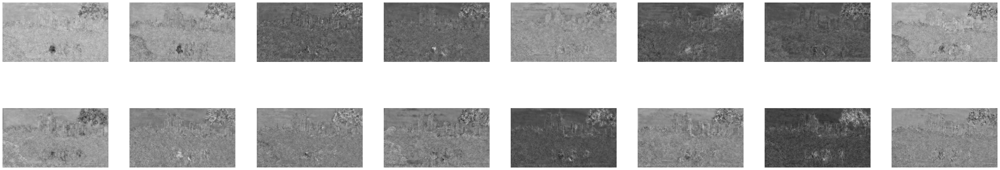

torch.Size([1, 256, 155, 275])
Layer  2


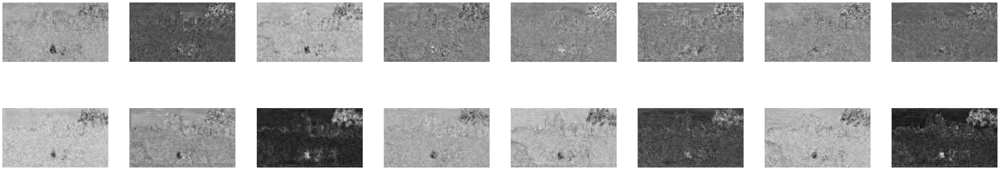

torch.Size([1, 256, 78, 138])
Layer  3


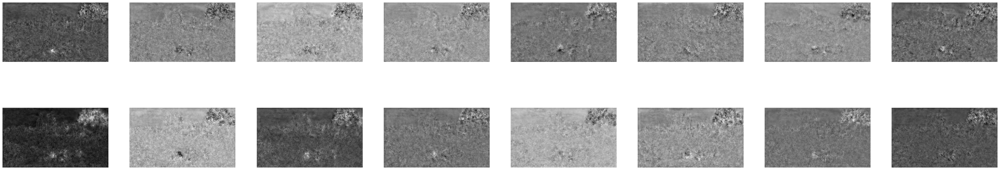

torch.Size([1, 256, 39, 69])
Layer  4


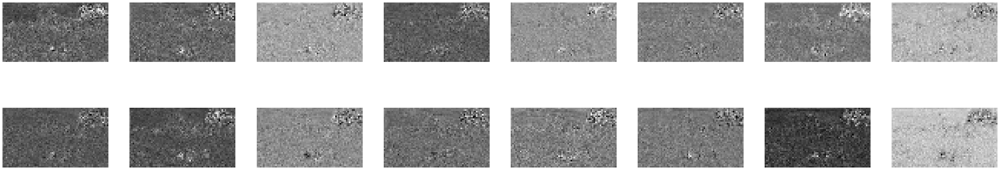

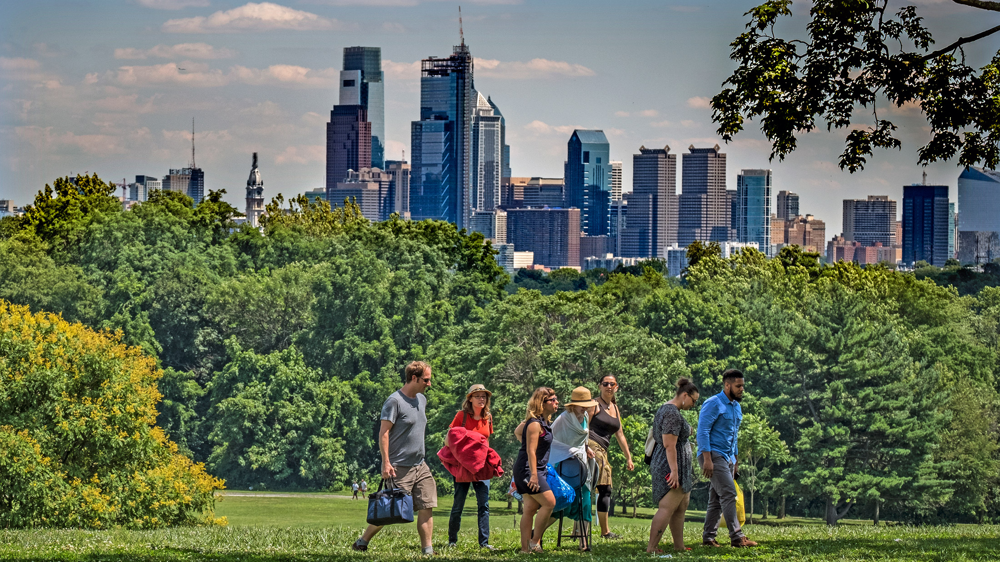

In [ ]:
import cv2 as cv
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

img = cv.imread('/content/drive/MyDrive/FairmountPark-R-Kennedy-2200VP.jpg')

img1 = np.float32(img)
img2 = img.transpose(2,0,1)
tensorImg = torch.from_numpy(img2)
tensorImg = torch.unsqueeze(tensorImg, 0)
print(tensorImg.shape)

neck = Feature_Pyramid_Network(Bottleneck, [2,2,2,2])
testTensor = tensorImg/255
outputs = neck(testTensor)
for num_layer in range(len(outputs)):
    print(outputs[num_layer].size())
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer][0, :, :, :]
    layer_viz = layer_viz.data
    print("Layer ",num_layer+1)
    for i, filter in enumerate(layer_viz):
        if i == 16: 
            break
        plt.subplot(2, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
    plt.show()
    plt.close()

cv2_imshow(img1)

